# dPCA

In [1]:
prefix = '/home/ines/repositories/'
# prefix = '/Users/ineslaranjeira/Documents/Repositories/'

In [2]:
""" 
IMPORTS
"""
import os
import autograd.numpy as np
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# --Machine learning and statistics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,  LabelBinarizer
from sklearn.cluster import KMeans
import umap
from sklearn import mixture
import pickle
from scipy.stats import mode
from dPCA import dPCA

# --Machine learning and statistics
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.preprocessing import OneHotEncoder
from scipy.stats import entropy

# Get my functions
functions_path =  prefix + 'representation_learning_variability/Functions/'
os.chdir(functions_path)
from data_processing import save_and_log
functions_path =  prefix + 'representation_learning_variability/Models/Sub-trial//2_fit_models/'
os.chdir(functions_path)
from preprocessing_functions import idxs_from_files

from one.api import ONE
one = ONE(mode='remote')

/home/ines/miniconda3/envs/iblenv/lib/python3.9/site-packages/one/alf/files.py:10: FutureWarning: `one.alf.files` will be removed in version 3.0. Use `one.alf.path` instead.
  warnings.warn(


## Parameters

In [3]:
# Parameters
bin_size = 0.017
num_states = 2
threshold = 0.0
optimal_k = 4

save_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Results/'  + str(bin_size) + '/'+str(num_states)+'_states/most_likely_states/'

# LOAD DATA
data_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Design matrix/' + 'v5_15Jan2025/' + str(bin_size) + '/'
all_files = os.listdir(data_path)
design_matrices = [item for item in all_files if 'design_matrix' in item and 'standardized' not in item]
idxs, mouse_names = idxs_from_files(design_matrices, bin_size)

states_path =  prefix + 'representation_learning_variability/DATA/Sub-trial/Results/' + str(bin_size) + '/'+str(num_states)+'_states/most_likely_states/'
wavelet_states_path = prefix + 'representation_learning_variability/DATA/Sub-trial/Results/'  + str(bin_size) + '/wavelet_transform_states/'

path_sets = [wavelet_states_path, states_path, states_path]


# Individual sessions

In [4]:
# Identify sessions available to process
sessions_to_process = []
for m, mat in enumerate(idxs):
    mouse_name = mat[37:]
    session = mat[:36]
    fit_id = str(mouse_name + session)
    whisker_filename = os.path.join(states_path, "most_likely_states" + 'whisker_me' + '_' + fit_id)
    licks_filename = os.path.join(states_path, "most_likely_states" + 'Lick count' + '_' + fit_id)
    wavelet_filename = os.path.join(wavelet_states_path, "most_likely_states_" + str(optimal_k) + '_' + fit_id)

    if os.path.exists(whisker_filename) and os.path.exists(licks_filename) and os.path.exists(wavelet_filename):
        sessions_to_process.append((mouse_name, session))

print(f"Found {len(sessions_to_process)} sessions to process.")

Found 215 sessions to process.


## Get sequences per trial epoch

In [5]:
results_path = prefix + 'representation_learning_variability/Models/Sub-trial/4_analyses/1_HMM_states/'
filename = str(results_path + 'epoch_sequences_10_03-11-2025')
all_sequences = pickle.load(open(filename, 'rb'))

In [6]:
design_df = all_sequences.pivot(index=['sample', 'trial_type', 'mouse_name'], columns=['broader_label'], values='binned_sequence').reset_index().dropna()
var_names = design_df.keys()[-4:]

In [7]:
df = design_df.copy()
df['feedback'] = df['trial_type'].str.split().str[:1].str.join('')
df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df['block'] = df['trial_type'].str.split().str[2:3].str.join('')
df['contrast'] = df['trial_type'].str.split().str[1:2].str.join('')
df['side'] = df['choice'].copy()
df.loc[(df['feedback']=='correct') & (df['choice']=='right'), 'side'] = 'left'
df.loc[(df['feedback']=='correct') & (df['choice']=='left'), 'side'] = 'right'

df['session'] = df['sample'].str.split().str[:1].str.join('')
df['trial_id'] = df['sample'].str.split().str[1:2].str.join('')

In [8]:

df['contrast'] = df['contrast'].astype(float)
df['block'] = df['block'].astype(float)


df['choice'] = df['trial_type'].str.split().str[3:4].str.join('')
df.loc[df['choice']=='left', 'choice'] = 0
df.loc[df['choice']=='right', 'choice'] = 1

df.loc[df['feedback']=='correct', 'feedback'] = 1
df.loc[df['feedback']=='incorrect', 'feedback'] = 0

# Prepare for dPCA

In [10]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

sequences_choice = np.vstack(df[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]

use_states = int(max(np.unique(use_sequences)))+1
timesteps = np.shape(use_sequences)[1]
binarized = np.zeros((np.shape(use_sequences)[0], timesteps*use_states))

for t in range(timesteps):
    label_binarizer = LabelBinarizer()
    label_binarizer.fit(range(use_states))
    encoded_arr = label_binarizer.transform(use_sequences[:, t])
    binarized[:, t*use_states:(t+1)*use_states] = encoded_arr
    # print('{0}'.format(encoded_arr))

Text(0.5, 1.0, 'Explained Variance by PCA')

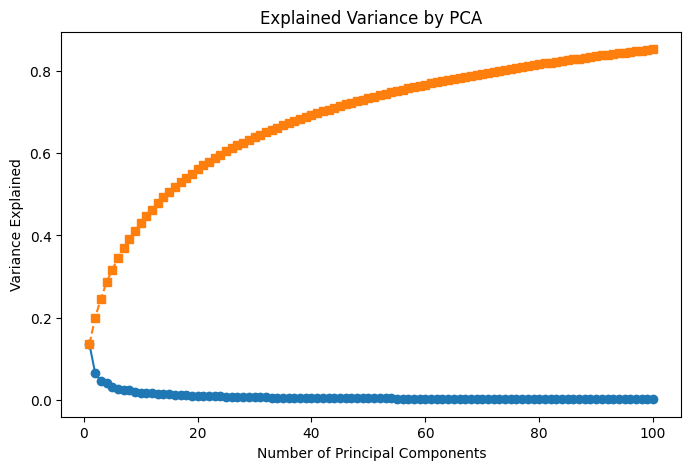

In [75]:
## Reduce dimensionality with PCA
n_components = 100
# Step 1: Reduce dimensions with PCA
pca = PCA(n_components)  # Reduce to 50 dimensions
ori_X = binarized.copy()
X_pca = pca.fit_transform(ori_X)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot explained variance
plt.figure(figsize=(8, 5))
plt.plot(range(1, n_components+1), explained_variance_ratio, marker='o', label='Individual')
plt.plot(range(1, n_components+1), cumulative_variance, marker='s', label='Cumulative', linestyle='--')
plt.xlabel("Number of Principal Components")
plt.ylabel("Variance Explained")
plt.title("Explained Variance by PCA")


In [81]:
pca_df = pd.DataFrame(X_pca)
pca_df['feedback'] = df['feedback']
pca_df['contrast'] = df['contrast']
pca_df['side'] = df['side']
pca_df['block'] = df['block']
pca_df['choice'] = df['choice']
pca_df['trial_id'] = df['trial_id']
pca_df['session'] = df['session']
pca_df['mouse_name'] = df['mouse_name']

<Axes: xlabel='0', ylabel='2'>

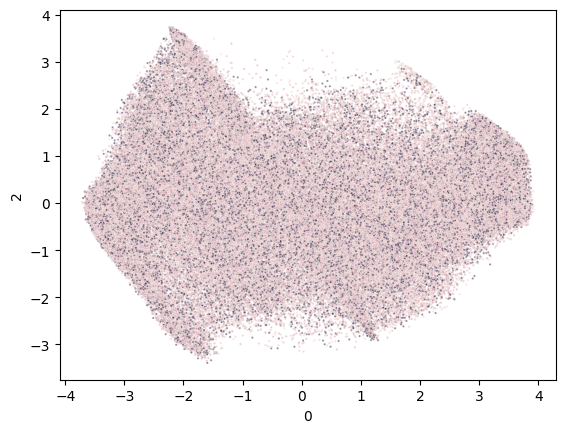

In [101]:
sns.scatterplot(x=0, y=2, hue='contrast', marker='.', s=10, alpha=.5, data=pca_df, legend='')

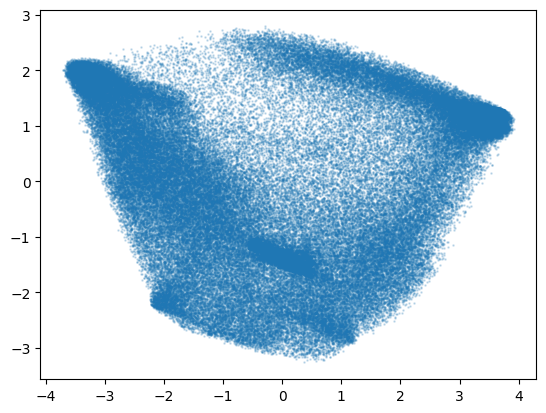

In [76]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], marker='.', s=3, alpha=.2)


In [108]:
import plotly.express as px

components = X_pca[:, :3]
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [10]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

var = 'contrast'

sequences_choice = np.vstack(df[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]

use_states = int(max(np.unique(use_sequences)))+1
timesteps = np.shape(use_sequences)[1]

stimulus_count = len(df[var].unique())
stimulus_types = df[var].unique()


## Separate states per variable (one-hot encoding)

In [16]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

var = 'side'
use_sequences = binarized.copy()

neurons = np.shape(use_sequences)[0]
timesteps = np.shape(use_sequences)[1]


In [28]:
np.shape(use_sequences)

(136666, 640)

In [37]:
use_sequences[stimulus_indices][:trials_per_condition]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [44]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

var = 'side'
use_sequences = binarized.copy()

neurons = np.shape(use_sequences)[1]
# timesteps = np.shape(use_sequences)[0]

# Stimulus 
stimulus_count = len(df[var].unique())
stimulus_values = df[var]
stimulus_types = df[var].unique()
stimulus_types.sort()
trials_per_condition = np.min(df[var].value_counts())

# Initialize matrices
X_frame = np.zeros((trials_per_condition, neurons, stimulus_count))
X_frame_mean = np.zeros((neurons, stimulus_count))

for s, stimulus in enumerate(stimulus_types):
    stimulus_indices = np.where(stimulus_values==stimulus)[0]
    X_frame[:, :, s] = use_sequences[stimulus_indices][:trials_per_condition]
    X_frame_mean[:, s] = np.mean(use_sequences[stimulus_indices][:trials_per_condition], axis=0)
    

# X_frame_mean-= np.mean(X_frame_mean.reshape((use_states,-1)),1)[:,None,None]

ValueError: operands could not be broadcast together with shapes (640,2) (16,1) (640,2) 

In [46]:
np.shape(X_frame_mean)

(640, 2)

In [12]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

var = 'side'
var_2 = 'feedback'

sequences_choice = np.vstack(df[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]

use_states = int(max(np.unique(use_sequences)))+1
timesteps = np.shape(use_sequences)[1]

# Stimulus 
stimulus_count = len(df[var].unique())
stimulus_values = df[var]
stimulus_types = df[var].unique()
stimulus_types.sort()
# trials_per_condition = np.min(df[var].value_counts())

feedback_count = len(df[var_2].unique())
feedback_values = df[var_2]
feedback_types = df[var_2].unique()
feedback_types.sort()

trials_per_condition = np.min([np.min(df[var].value_counts()), np.min(df[var_2].value_counts())])
trials_per_condition = 11934

# Initialize matrices
X_frame = np.zeros((trials_per_condition, use_states, stimulus_count, feedback_count, timesteps))
X_frame_mean = np.zeros((use_states, stimulus_count, feedback_count, timesteps))


for t in range(timesteps):
    label_binarizer = LabelBinarizer()
    label_binarizer.fit(range(use_states))
    encoded_arr = label_binarizer.transform(use_sequences[:, t])

    for s, stimulus in enumerate(stimulus_types):
        for f, feedback in enumerate(feedback_types):
            use_indices = np.where((stimulus_values==stimulus) & (feedback_values==feedback))
            X_frame[:, :, s, f, t] = encoded_arr[use_indices][:trials_per_condition]
            X_frame_mean[:, s, f, t] = np.mean(encoded_arr[use_indices][:trials_per_condition], axis=0)
    

# X_frame_mean-= np.mean(X_frame_mean.reshape((use_states,-1)),1)[:,None,None]

In [53]:
dpca = dPCA.dPCA(labels='s', n_components=100, regularizer='auto')
# dpca.protect = ['t']
dpca.n_trials = 3

You chose to determine the regularization parameter automatically. This can
                    take substantial time and grows linearly with the number of crossvalidation
                    folds. The latter can be set by changing self.n_trials (default = 3). Similarly,
                    use self.protect to set the list of axes that are not supposed to get to get shuffled
                    (e.g. upon splitting the data into test- and training, time-points should always
                    be drawn from the same trial, i.e. self.protect = ['t']). This can significantly
                    speed up the code.


In [54]:
np.shape(X_frame)

(67177, 640, 2)

In [55]:
Z = dpca.fit_transform(X_frame_mean,X_frame)

Start optimizing regularization.
Starting trial  1 / 3


TypeError: 'NoneType' object is not iterable

In [31]:
cv_score =dpca.crossval_score(lams, X_frame_mean, X_frame)
dpca.n_components
len(dpca.explained_variance_ratio_['s'])

NameError: name 'lams' is not defined

In [41]:
plt.plot(dpca.explained_variance_ratio_['s'])


AttributeError: 'dPCA' object has no attribute 'explained_variance_ratio_'

In [39]:
len(dpca.explained_variance_ratio_['s'])

16

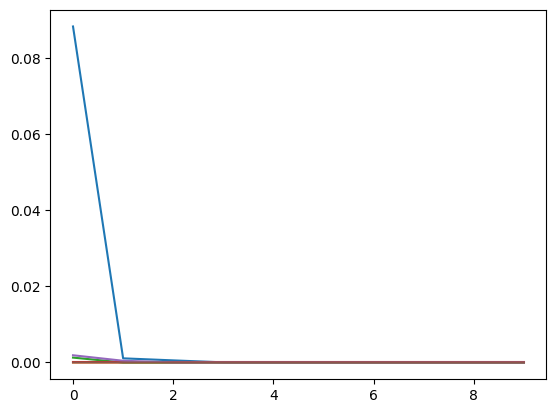

In [ ]:
plt.plot(dpca.explained_variance_ratio_['t'])
plt.plot(dpca.explained_variance_ratio_['s'])
plt.plot(dpca.explained_variance_ratio_['f'])
plt.plot(dpca.explained_variance_ratio_['st'])
plt.plot(dpca.explained_variance_ratio_['ft'])
plt.plot(dpca.explained_variance_ratio_['sf'])


Text(0.5, 1.0, '1st time component')

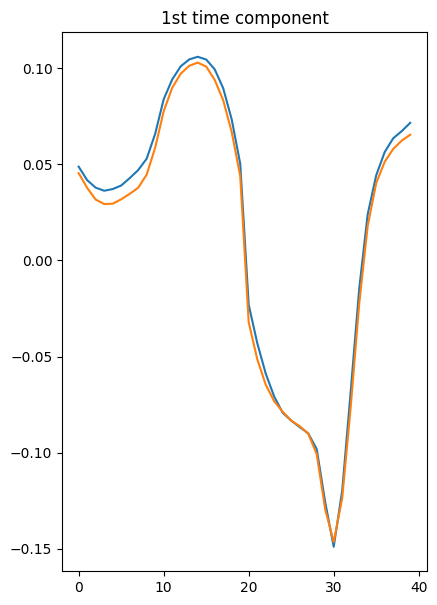

In [130]:
figure(figsize=(16,7))
subplot(131)

for s in range(feedback_count):
    
    plot(time,Z['t'][0,s, 0])

title('1st time component')

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


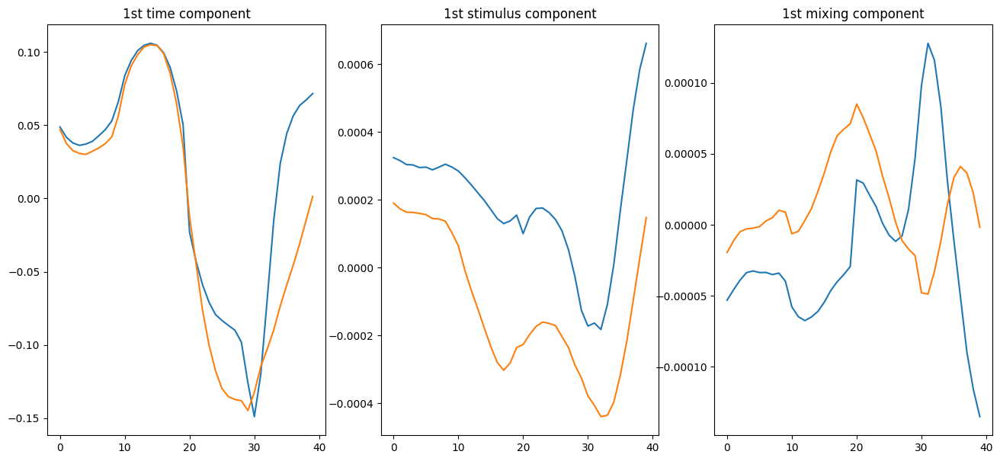

In [131]:

%pylab inline
from numpy import *
from numpy.random import rand, randn, randint

time = np.arange(timesteps)

figure(figsize=(16,7))
subplot(131)

for s in range(stimulus_count):
    plot(time,Z['t'][0,0, s])

title('1st time component')
    
subplot(132)

for s in range(stimulus_count):
    plot(time,Z['s'][0, 0,s])
    
title('1st stimulus component')
    
subplot(133)

for s in range(stimulus_count):
    plot(time,Z['st'][0, 0, s])
    
title('1st mixing component')
show()


## Reshape for dPCA

In [20]:
from numpy import *
from numpy.random import rand, randn, randint
# number of neurons, time-points and stimuli
N,T,S = 100,250,6

# noise-level and number of trials in each condition
noise, n_samples = 0.2, 10

# build two latent factors
zt = (np.arange(T)/float(T))
zs = (np.arange(S)/float(S))

# build trial-by trial data
trialR = noise*randn(n_samples,N,S,T)
trialR += randn(N)[None,:,None,None]*zt[None,None,None,:]
trialR += randn(N)[None,:,None,None]*zs[None,None,:,None]

# trial-average data
R = mean(trialR,0)

# center data
R -= np.mean(R.reshape((N,-1)),1)[:,None,None]



In [23]:
mat = pd.DataFrame(final_matrix)
mat['mouse_number'] = pd.factorize(df['mouse_name'])[0]


In [24]:
np.shape(R)

(100, 6, 250)

# Visualize clusters

In [104]:
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'][0]))
diagonal['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
diagonal = diagonal.rename(columns={0: 'accuracy'})

cluster_df = pd.DataFrame(clusters)
cluster_df['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
cluster_df = cluster_df.rename(columns={0: 'mouse_cluster'})

trials = trials.merge(cluster_df, on=['mouse_number'])

In [184]:
wheel_0_mapping = {0:0, 1:1, 2:0, 3:0,
                 4:0, 5:1, 6:0, 7:0,
                 8:0, 9:1, 10:0, 11:0,
                 12:0, 13:1, 14:0, 15:0}
wheel_1_mapping = {0:0, 1:0, 2:1, 3:0,
                 4:0, 5:0, 6:1, 7:0,
                 8:0, 9:0, 10:1, 11:0,
                 12:0, 13:0, 14:1, 15:0}
wheel_2_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:1,
                 8:0, 9:0, 10:0, 11:1,
                 12:0, 13:0, 14:0, 15:1}
wheel_3_mapping = {0:1, 1:0, 2:0, 3:0,
                 4:1, 5:0, 6:0, 7:0,
                 8:1, 9:0, 10:0, 11:0,
                 12:1, 13:0, 14:0, 15:0}
whisker_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:1, 5:1, 6:1, 7:1,
                 8:0, 9:0, 10:0, 11:0,
                 12:1, 13:1, 14:1, 15:1}
lick_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:0,
                 8:1, 9:1, 10:1, 11:1,
                 12:1, 13:1, 14:1, 15:1}


## With error bars

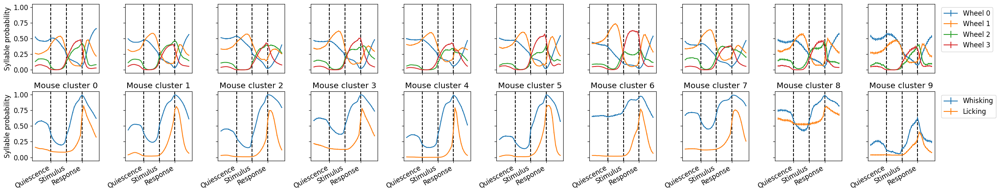

In [187]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(2, np.max(clusters)+1, sharex=True, sharey=True, figsize=(25, 5))

for c, cluster in enumerate(np.arange(0, np.max(clusters)+1)):
    
    cluster_data = trials.loc[trials['mouse_cluster']==cluster]
    use_sequences = np.array(cluster_data.drop(columns=['mouse_name', 'mouse_number', 'mouse_cluster']))

    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel_0 = np.vectorize(wheel_0_mapping.get)
    replace_wheel_1 = np.vectorize(wheel_1_mapping.get)
    replace_wheel_2 = np.vectorize(wheel_2_mapping.get)
    replace_wheel_3 = np.vectorize(wheel_3_mapping.get)
    wheel_state_0 = replace_wheel_0(use_sequences)    
    wheel_state_1 = replace_wheel_1(use_sequences)    
    wheel_state_2 = replace_wheel_2(use_sequences)    
    wheel_state_3 = replace_wheel_3(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    
    # Mean
    whisker_count = np.mean(whisker_states, axis=0)
    lick_count = np.mean(lick_states, axis=0)
    wheel_count_0 = np.mean(wheel_state_0, axis=0)
    wheel_count_1 = np.mean(wheel_state_1, axis=0)
    wheel_count_2 = np.mean(wheel_state_2, axis=0)
    wheel_count_3 = np.mean(wheel_state_3, axis=0)
        
    all_stacked = np.vstack([wheel_count_0, wheel_count_1, wheel_count_2, wheel_count_3,
                             whisker_count, lick_count])

    # Error
    whisker_error = np.std(whisker_states, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    lick_error = np.std(lick_states, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_0 = np.std(wheel_state_0, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_1 = np.std(wheel_state_1, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_2 = np.std(wheel_state_2, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
    wheel_error_3 = np.std(wheel_state_3, axis=0)/np.sqrt(np.shape(whisker_states)[0])*1.96
        
    all_error_stacked = np.vstack([wheel_error_0, wheel_error_1, wheel_error_2, wheel_error_3, 
                                   whisker_error, lick_error])
    
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[0:1, :][0], yerr=all_error_stacked[0:1, :][0], label='Wheel 0')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[1:2, :][0], yerr=all_error_stacked[1:2, :][0], label='Wheel 1')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[2:3, :][0], yerr=all_error_stacked[2:3, :][0], label='Wheel 2')
    axs[0, c].errorbar(np.arange(0, 40, 1), all_stacked[3:4, :][0], yerr=all_error_stacked[3:4, :][0], label='Wheel 3')
      
    axs[1, c].errorbar(np.arange(0, 40, 1), all_stacked[4:5, :][0], yerr=all_error_stacked[4:5, :][0], label='Whisking')
    axs[1, c].errorbar(np.arange(0, 40, 1), all_stacked[5:6, :][0], yerr=all_error_stacked[5:6, :][0], label='Licking')

    axs[0, c].axvline(x=10, color='k', linestyle='--')
    axs[0, c].axvline(x=20, color='k', linestyle='--')
    axs[0, c].axvline(x=30, color='k', linestyle='--')
    axs[1, c].axvline(x=10, color='k', linestyle='--')
    axs[1, c].axvline(x=20, color='k', linestyle='--')
    axs[1, c].axvline(x=30, color='k', linestyle='--')

    axs[1, c].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    axs[1, c].set_title('Mouse cluster ' +str(cluster))
axs[0, c].legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[1, c].legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0, 0].set_ylabel('Syllable probability')
axs[1, 0].set_ylabel('Syllable probability')
plt.tight_layout()
plt.show()


## Analyze entropy across trial per animal

In [ ]:
trials = pd.DataFrame(binarized)
trials['mouse_name'] = merged_df['mouse_name']
trials['mouse_number'] = pd.factorize(merged_df['mouse_name'])[0]
diagonal = pd.DataFrame(np.diag(decoding_result.loc[decoding_result['shuffle']==0, 'confusion_matrix'][0]))
diagonal['mouse_number'] = list(trials['mouse_number'].drop_duplicates())
diagonal = diagonal.rename(columns={0: 'accuracy'})
trials = trials.merge(diagonal, on=['mouse_number'])

Text(0.5, 0, 'Decoding accuracy')

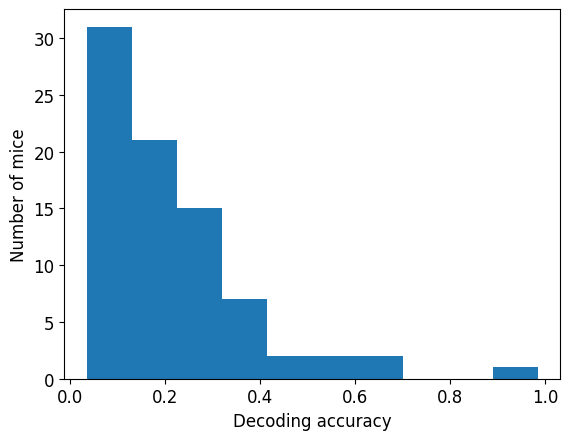

In [206]:
plt.hist(diagonal['accuracy'])
plt.ylabel('Number of mice')
plt.xlabel('Decoding accuracy')

In [186]:
entropy_df = pd.DataFrame(columns=['mouse_name',  'accuracy', 'bin', 'entropy'])

for m, mouse in enumerate(trials['mouse_name'].unique()):
    
    use_df = trials.loc[trials['mouse_name']==mouse]
    state_probs = np.mean(use_df.drop(columns=['mouse_name', 'mouse_number', 'accuracy']), axis=0)
    
    mouse_entropy = pd.DataFrame(columns=['mouse_name', 'accuracy', 'bin', 'entropy'], index=range(timesteps))
    mouse_entropy['mouse_name'] = mouse
    mouse_entropy['accuracy'] = list(use_df['accuracy'])[0]
    
    for t in range(timesteps):
        # label_binarizer = LabelBinarizer()
        # label_binarizer.fit(range(use_states))
        # encoded_arr = label_binarizer.transform(use_sequences[:, t])
        bin_data = state_probs[t*16:(t+1)*16]
        ent = entropy(bin_data)/np.log(16)
        mouse_entropy['entropy'][t] = ent
        mouse_entropy['bin'][t] = t
        
    entropy_df = pd.concat([entropy_df, mouse_entropy])
        
    

/tmp/ipykernel_19502/2226901285.py:18: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  mouse_entropy['entropy'][t] = ent
/tmp/ipykernel_19502/2226901285.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

In [210]:
entropy_df['accuracy_type'] = entropy_df['accuracy']
entropy_df.loc[entropy_df['accuracy_type']<.05, 'accuracy_type'] = 0
entropy_df.loc[entropy_df['accuracy_type']>.3, 'accuracy_type'] = 2
entropy_df.loc[(entropy_df['accuracy_type']>.05) &
               (entropy_df['accuracy_type']<.3), 'accuracy_type'] = 1



Text(0.5, 0, 'Trial events')

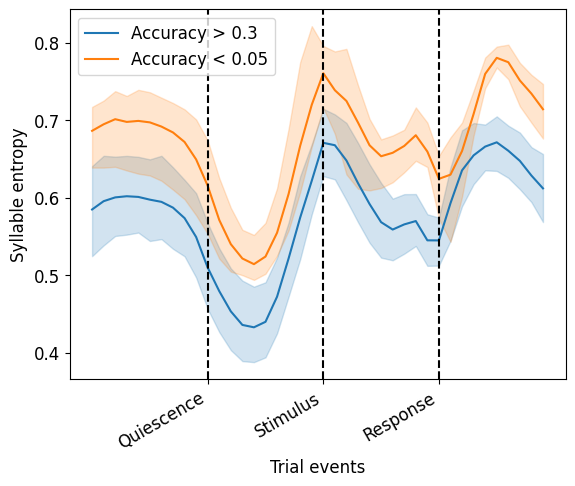

In [220]:
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']>.3], label='Accuracy > 0.3')
# sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[(entropy_df['accuracy']>.05) &
#                                                        (entropy_df['accuracy']<.3)])
sns.lineplot(x='bin', y='entropy', data=entropy_df.loc[entropy_df['accuracy']<.05], label='Accuracy < 0.05')


plt.axvline(x=10, color='k', linestyle='--')
plt.axvline(x=20, color='k', linestyle='--')
plt.axvline(x=30, color='k', linestyle='--')

plt.xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
plt.ylabel('Syllable entropy')
plt.xlabel('Trial events')

## Vizualize results

In [216]:
wheel_mapping = {0:0, 1:1, 2:2, 3:3,
                 4:0, 5:1, 6:2, 7:3,
                 8:0, 9:1, 10:2, 11:3,
                 12:0, 13:1, 14:2, 15:3}
whisker_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:1, 5:1, 6:1, 7:1,
                 8:0, 9:0, 10:0, 11:0,
                 12:1, 13:1, 14:1, 15:1}
lick_mapping = {0:0, 1:0, 2:0, 3:0,
                 4:0, 5:0, 6:0, 7:0,
                 8:1, 9:1, 10:1, 11:1,
                 12:1, 13:1, 14:1, 15:1}
replace_wheel = np.vectorize(wheel_mapping.get)
# wheel_states = replace_wheel(use_sequences)
replace_whisker = np.vectorize(whisker_mapping.get)
# whisker_states = replace_whisker(use_sequences)
replace_lick = np.vectorize(lick_mapping.get)

In [ ]:
# select mice with very good decoding or bad

/tmp/ipykernel_19502/2601245174.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')


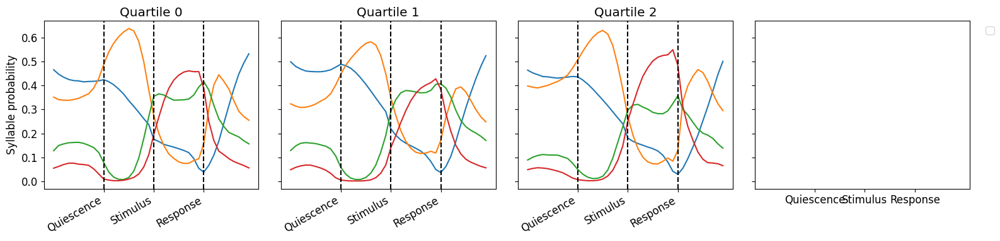

In [217]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 4))

use_data = trial_clusters.merge(entropy_df[['mouse_name', 'accuracy_type']].drop_duplicates(), on=['mouse_name'])


for q, quartile in enumerate([0, 1, 2]):
    cluster_data = use_data.loc[use_data['accuracy_type']==quartile]
    sequences_choice = np.vstack(cluster_data[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
    use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]
    
    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel = np.vectorize(wheel_mapping.get)
    wheel_states = replace_wheel(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    whisker_count = np.zeros((1, 40))
    lick_count = np.zeros((1, 40))
    wheel_count = np.zeros((4, 40))

    for b, bin in enumerate(range(40)):
        # counts, bins = np.histogram(use_sequences[:, b], range=(0,15), bins=16)
        whisker_count[0, b] = np.sum(whisker_states[:, b]==1)/len(whisker_states[:, b])
        lick_count[0, b] = np.sum(lick_states[:, b]==1)/len(lick_states[:, b])
        wheel_count[0, b] = np.sum(wheel_states[:, b]==1)/len(wheel_states[:, b])
        wheel_count[1, b] = np.sum(wheel_states[:, b]==2)/len(wheel_states[:, b])
        wheel_count[2, b] = np.sum(wheel_states[:, b]==3)/len(wheel_states[:, b])
        wheel_count[3, b] = np.sum(wheel_states[:, b]==0)/len(wheel_states[:, b])
    
    all_stacked = np.vstack([wheel_count, whisker_count, lick_count])
    # all_stacked = np.vstack([wheel_count])

    # cmap_value_1 = create_shaded_cmap(colors[q], name='cmap_value_1')
    # image = axs[c].imshow(all_stacked, cmap=cmap_value_1, aspect='auto')
    axs[q].plot(all_stacked[0:4, :].T, label=['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    # image = axs[q].imshow(all_stacked, cmap='Greys', aspect='auto')
    # fig.colorbar(image, ax=axs[q], location='right', anchor=(0, 0.3))
    # axs[q].set_yticks(np.arange(0, 6, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3', 'Whisking', 'Licking'])
    # axs[c].set_yticks(np.arange(0, 4, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    axs[q].axvline(x=10, color='k', linestyle='--')
    axs[q].axvline(x=20, color='k', linestyle='--')
    axs[q].axvline(x=30, color='k', linestyle='--')

    axs[q].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    # axs[c].set_xlabel('Time in epoch')
    axs[q].set_title('Quartile ' +str(quartile))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0].set_ylabel('Syllable probability')
plt.tight_layout()
plt.show()

/tmp/ipykernel_19502/1841012585.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')


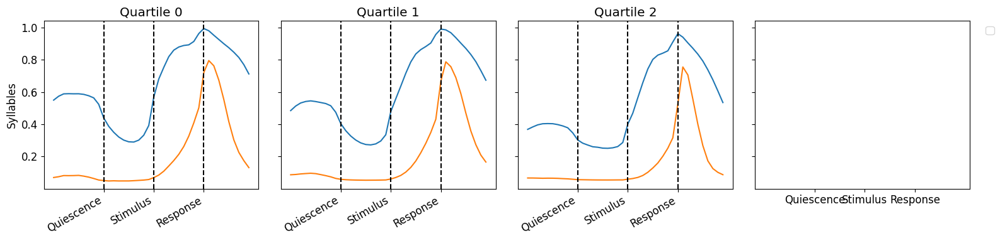

In [218]:
epoch_to_analyse = ['Pre-quiescence', 'Quiescence', 'Choice', 'ITI']

color = sns.color_palette("Set2", 7)
fig, axs = plt.subplots(1, 4, sharex=True, sharey=True, figsize=(16, 4))

use_data = trial_clusters.merge(entropy_df[['mouse_name', 'accuracy_type']].drop_duplicates(), on=['mouse_name'])


for q, quartile in enumerate([0, 1, 2]):
    
    cluster_data = use_data.loc[use_data['accuracy_type']==quartile]
    sequences_choice = np.vstack(cluster_data[epoch_to_analyse].apply(lambda row: np.hstack(row), axis=1))  # Transpose to get the right shape
    use_sequences = sequences_choice[~np.isnan(sequences_choice).any(axis=1)]
    
    replace_whisker = np.vectorize(whisker_mapping.get)
    whisker_states = replace_whisker(use_sequences)
    replace_wheel = np.vectorize(wheel_mapping.get)
    wheel_states = replace_wheel(use_sequences)    
    replace_lick = np.vectorize(lick_mapping.get)
    lick_states = replace_lick(use_sequences)
    
    whisker_count = np.zeros((1, 40))
    lick_count = np.zeros((1, 40))
    wheel_count = np.zeros((4, 40))

    for b, bin in enumerate(range(40)):
        # counts, bins = np.histogram(use_sequences[:, b], range=(0,15), bins=16)
        whisker_count[0, b] = np.sum(whisker_states[:, b]==1)/len(whisker_states[:, b])
        lick_count[0, b] = np.sum(lick_states[:, b]==1)/len(lick_states[:, b])
        wheel_count[0, b] = np.sum(wheel_states[:, b]==1)/len(wheel_states[:, b])
        wheel_count[1, b] = np.sum(wheel_states[:, b]==2)/len(wheel_states[:, b])
        wheel_count[2, b] = np.sum(wheel_states[:, b]==3)/len(wheel_states[:, b])
        wheel_count[3, b] = np.sum(wheel_states[:, b]==0)/len(wheel_states[:, b])
    
    all_stacked = np.vstack([wheel_count, whisker_count, lick_count])
    # all_stacked = np.vstack([wheel_count])

    # cmap_value_1 = create_shaded_cmap(colors[q], name='cmap_value_1')
    # image = axs[c].imshow(all_stacked, cmap=cmap_value_1, aspect='auto')
    axs[q].plot(all_stacked[4:6, :].T, label=['Whisking', 'Licking'])
    # image = axs[q].imshow(all_stacked, cmap='Greys', aspect='auto')
    # fig.colorbar(image, ax=axs[q], location='right', anchor=(0, 0.3))
    # axs[q].set_yticks(np.arange(0, 6, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3', 'Whisking', 'Licking'])
    # axs[c].set_yticks(np.arange(0, 4, 1), ['Wheel 0', 'Wheel 1', 'Wheel 2', 'Wheel 3'])
    axs[q].axvline(x=10, color='k', linestyle='--')
    axs[q].axvline(x=20, color='k', linestyle='--')
    axs[q].axvline(x=30, color='k', linestyle='--')

    axs[q].set_xticks(np.arange(10, 31, 10), ['Quiescence', 'Stimulus', 'Response'], rotation=30, ha='right')
    # axs[c].set_xlabel('Time in epoch')
    axs[q].set_title('Quartile ' +str(quartile))
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left')
axs[0].set_ylabel('Syllables')
plt.tight_layout()
plt.show()